In [1]:
import numpy as np
import matplotlib.pyplot as plt
import torch
import torch.cuda
import torchvision.transforms.functional as TF
import torchvision.transforms as transforms
import os
from joblib import dump, load
from PIL import Image
from tqdm.notebook import tqdm
from torch.nn.functional import relu
from torch.utils.data import DataLoader, Dataset
from sklearn.manifold import TSNE
from SHG import SHG
from utils import *
from matplotlib.offsetbox import OffsetImage, AnnotationBbox
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn.base import clone
from sklearn_extra.cluster import KMedoids

In [16]:
""" FUNCTIONS USED THROUGHOUT THE NOTEBOOK """

def create_data(train_dataloader, device, model, NUM_DATAPOINTS, save = False):
    """ Finds NUM_DATAPOINTS from train_dataloader of fully annotated images """
    bottleneck_arr = []
    gt_heatmaps = []
    IDs = []

    with torch.no_grad():
        for x, y, id_ in tqdm(train_dataloader):
            x = x.to(device, dtype = torch.float)

            if (0 not in np.array(turn_featuremaps_to_keypoints(y)).reshape((-1, 3))[:, -1]):
                _, bottleneck = model(x)

                bottleneck_arr.append(bottleneck[2].cpu().data.numpy().flatten())
                gt_heatmaps.append(turn_featuremaps_to_keypoints(y))
                IDs.append(id_)
                print(len(bottleneck_arr))

                if (len(bottleneck_arr) == NUM_DATAPOINTS):
                    break

    bottleneck_arr = np.array(bottleneck_arr).reshape((len(bottleneck_arr), -1))
    gt_heatmaps = np.array(gt_heatmaps).reshape((len(gt_heatmaps), -1))
    
    if (save):
        dump(IDs, SAVING_PATH + str(NUM_DATAPOINTS) + "/" + "IDs.joblib") # Saving the IDs of the images worked on

    return bottleneck_arr, gt_heatmaps, IDs

def create_pca(bottleneck_arr, save_figs = False, SAVING_PATH = None, NUM_COMPONENTS = None, show_figs = True):
    """ Fits PCA on the data with visualizations """

    if (NUM_COMPONENTS is None):
        NUM_COMPONENTS = bottleneck_arr.shape[1]

    pca = PCA(n_components = NUM_COMPONENTS).fit(bottleneck_arr)

    if (not show_figs and save_figs):
        print("Not able to save plots - let show_figs = True to fix")
    
    if (show_figs):
        plt.figure()
        plt.title("Explained variance of each component")
        plt.xlabel("Principal component")
        plt.ylabel("Explained variance ratio")
        plt.plot(np.arange(0, NUM_COMPONENTS), pca.explained_variance_ratio_, label = "Explained variance ratio")
        plt.legend()
        plt.xticks(np.arange(1, NUM_COMPONENTS + 1, 250), rotation = 90)
        plt.yscale("log")

        if (save_figs and SAVING_PATH is not None):
            plt.savefig(SAVING_PATH + "explained_var_ratio.png")
        elif (save_figs and SAVING_PATH is None):
            print("Not able to save image")

        plt.show()

    if (not show_figs and save_figs):
        print("Not able to save plots - let show_figs = True to fix")
    
    if (show_figs):
        plt.figure()
        plt.title("Cummulative sum of explained variance")
        plt.xlabel("Number of components")
        plt.ylabel("Total explained variance ratio")
        plt.plot(np.arange(0, NUM_COMPONENTS), np.cumsum(pca.explained_variance_ratio_), label = "Cum. sum of explained var.")
        plt.axhline(y=0.95, color='r', linestyle='-', xmax = 550/len(pca.explained_variance_ratio_))
        plt.axvline(x=464, color='r', linestyle='-', ymax = 0.88)
        plt.legend()
        plt.xticks(np.arange(1, NUM_COMPONENTS + 1, 250), rotation = 90)
        plt.yticks(np.append(np.arange(0.4, 1.1, 0.1), 0.95))

        if (save_figs and SAVING_PATH is not None):
            plt.savefig(SAVING_PATH + "cum_explained_var_ratio.png")
        elif (save_figs and SAVING_PATH is None):
            print("Not able to save image")
        
        plt.show()

    return pca

def visualize_2d_skeleton_plot(X, Y, is_pca = False, pca = None, save_figs = False, SAVING_PATH = None, fig_size = (20, 15), zoom = 0.5):
    """ Visualizes a 2D plot with the keypoints annotated """
    plt.figure(figsize = fig_size)

    fig, ax = plt.subplots(figsize = fig_size)
    for x, y in zip(X, Y):
        image = draw_skeleton(np.round(y))
        im = OffsetImage(image, zoom = zoom)
        ab = AnnotationBbox(im, (x[0], x[1]), xycoords = "data", frameon = False)
        ax.add_artist(ab)
        ax.update_datalim([(x[0], x[1])])
        ax.autoscale()

    if (is_pca and pca is not None):
        plt.xlabel("Principal component 1\nExplained Variance ratio: {:.3f}".format(pca.explained_variance_ratio_[0]))
        plt.ylabel("Principal component 2\nExplained Variance ratio: {:.3f}".format(pca.explained_variance_ratio_[1]))
    elif (is_pca and pca is None):
        print("Cannot write variance on axises")
    
    if (save_figs and SAVING_PATH is not None):
        plt.savefig(SAVING_PATH + str(NUM_DATAPOINTS) + "/" + str(NUM_COMPONENTS) + "/" + "pca.png")
    elif (save_figs and SAVING_PATH is None):
        print("Not able to save image")

    plt.show()

def run_clustering(X, max_k = 10, max_iter = 1000, model_type = "KMedoids", save_fig = False, save_model = False, SAVING_PATH = None, data_reduction_method_used = None):
    Ks = np.arange(2, max_k, 1) # Which k's to use for KMeans/KMedoids
    sil = [] # Storing silhouette score
    best_model = None # Storing the best model, based on silhouette score
    overall_best_sil = -1 # Storing the best silhouette score
    best_centroids = None
    inertias = []

    for k in tqdm(Ks, desc = "k", leave = False):

        # Which modeltype to use
        if (model_type == "KMeans"):
            model = KMeans(n_clusters = k, max_iter = max_iter).fit(X)
        elif (model_type == "KMedoids"):
            model = KMedoids(n_clusters = k, max_iter = max_iter).fit(X)
        
        # Computes silhouette score
        labels = model.labels_
        cur_sil = silhouette_score(X, labels, metric = 'euclidean')

        # Inertia
        inertias.append(model.inertia_)

        # Compares current silhouette score with the best silhouette score of the current k
        if (cur_sil > overall_best_sil):
            best_model = clone(model)
            overall_best_sil = cur_sil
            best_centroids = model.cluster_centers_

        # Appends the best silhouette score of each k
        sil.append(cur_sil)

    # Plotting silhouette score
    sil = np.array(sil)
    plt.figure()
    plt.plot(np.arange(2, max_k, 1), sil)
    plt.xticks(np.arange(2, max_k, 1))
    plt.title("Best silhouette score for each cluster")
    plt.xlabel("Amount of clusters")
    plt.ylabel("Silhouette score")

    if (save_fig and SAVING_PATH is not None and data_reduction_method_used is not None):
        plt.savefig(SAVING_PATH + str(X.shape[0]) + "/" + str(X.shape[1]) + "/" + "{}_silhouette_score.png".format(data_reduction_method_used))
    elif (save_fig and (SAVING_PATH is None or data_reduction_method_used is None)):
        print("Could not save fig")

    if (save_model and SAVING_PATH is not None and data_reduction_method_used is not None):
        dump(best_model, SAVING_PATH + str(X.shape[0]) + "/" + str(X.shape[1]) + "/" + "{}_best_{}_{}.joblib".format(data_reduction_method_used, model_type, np.argmax(sil) + 2))
    elif (save_model and (SAVING_PATH is None or data_reduction_method_used is None)):
        print("Could not save model")

    plt.show()

    # Plotting inertia
    plt.figure()
    plt.plot(np.arange(2, max_k, 1), inertias)
    plt.xticks(np.arange(2, max_k, 1))
    plt.title("Inertia for each amount of clusters")
    plt.xlabel("Amount of clusters")
    plt.ylabel("Inertia")
    plt.show()

    return model, sil, best_centroids

In [3]:
""" PATHS """
# Input images
TRAIN_IMGS_PATH = "C:/Users/André/OneDrive 2/OneDrive/Skrivebord/bsc_data/train/image/"

# Ground truth heatmaps
TRAIN_HEATMAPS_PATH = "C:/Users/André/OneDrive 2/OneDrive/Skrivebord/bsc_data/train/heatmaps/"

# Path for model
MODEL_DIR = "C:/Users/André/OneDrive 2/OneDrive/Skrivebord/bsc_data/models/Mon_Apr_12_18-11-59_2021/epoch_46.pth"

# Path for mean rgb
average_rgb = np.loadtxt("./average_rgb.npy")

# Saving path
SAVING_PATH = "C:/Users/André/OneDrive 2/OneDrive/Skrivebord/bsc_data/latent_space/"

In [4]:
""" DATASET AND DATALOADER """

class dataset(Dataset):
    def __init__(self, X_path, y_path, average_rgb):
        self.X_path = X_path
        self.y_path = y_path
        self.X_data = os.listdir(self.X_path)
        self.average_rgb = average_rgb
        self.norm = transforms.Normalize(mean = self.average_rgb, std = [1, 1, 1])

    def __len__(self):
        return len(self.X_data)

    def __getitem__(self, i):
        ID = self.X_data[i]
        x = Image.open(self.X_path + ID)

        y = []

        for i in range(17):
            y.append(torch.from_numpy(np.load(self.y_path + ID[:-4] + "/" + str(i) + ".npy")))

        x = TF.to_tensor(x)

        if (x.shape[0] == 1): # If the image is gray-scale, cast it to rgb
            x = torch.stack((x[0],) * 3)

        x = self.norm(x) # Subtracts mean rgb

        y = torch.stack(y)
        return x, y, ID

train_data = dataset(TRAIN_IMGS_PATH, TRAIN_HEATMAPS_PATH, average_rgb)
train_dataloader = DataLoader(train_data, batch_size = 1, shuffle = True)

In [5]:
""" LOADING MODEL """
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

model = SHG(num_hourglasses = 1, use_skip_connections = False).to(device)
model.load_state_dict(torch.load(MODEL_DIR))
model.eval()
print()

In [8]:
bottleneck_arr, gt_heatmaps, IDs = create_data(train_dataloader, device, model, 7017) # Finds 7017/all fully annotated images

018
3019
3020
3021
3022
3023
3024
3025
3026
3027
3028
3029
3030
3031
3032
3033
3034
3035
3036
3037
3038
3039
3040
3041
3042
3043
3044
3045
3046
3047
3048
3049
3050
3051
3052
3053
3054
3055
3056
3057
3058
3059
3060
3061
3062
3063
3064
3065
3066
3067
3068
3069
3070
3071
3072
3073
3074
3075
3076
3077
3078
3079
3080
3081
3082
3083
3084
3085
3086
3087
3088
3089
3090
3091
3092
3093
3094
3095
3096
3097
3098
3099
3100
3101
3102
3103
3104
3105
3106
3107
3108
3109
3110
3111
3112
3113
3114
3115
3116
3117
3118
3119
3120
3121
3122
3123
3124
3125
3126
3127
3128
3129
3130
3131
3132
3133
3134
3135
3136
3137
3138
3139
3140
3141
3142
3143
3144
3145
3146
3147
3148
3149
3150
3151
3152
3153
3154
3155
3156
3157
3158
3159
3160
3161
3162
3163
3164
3165
3166
3167
3168
3169
3170
3171
3172
3173
3174
3175
3176
3177
3178
3179
3180
3181
3182
3183
3184
3185
3186
3187
3188
3189
3190
3191
3192
3193
3194
3195
3196
3197
3198
3199
3200
3201
3202
3203
3204
3205
3206
3207
3208
3209
3210
3211
3212
3213
3214
3215
3216
3217
3

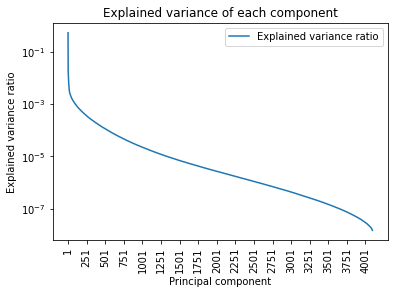

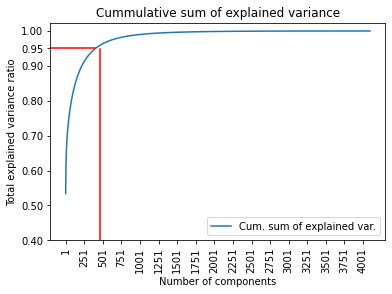

Explained variance 0.5617827270179987


In [17]:
""" PCA on the 10.000 datapoints"""
pca_full = create_pca(bottleneck_arr, show_figs = True)
bottleneck_pca_transformed_full = pca_full.transform(bottleneck_arr)

NUM_COMPONENTS = 2 # As we want to do some visualization, we only care about the first two components in this case
pca_2 = create_pca(bottleneck_arr, NUM_COMPONENTS = NUM_COMPONENTS, show_figs = False)
bottleneck_pca_transformed_2 = pca_2.transform(bottleneck_arr)
print("Explained variance", sum(pca_2.explained_variance_ratio_)) 

#dump(pca, SAVING_PATH + str(NUM_DATAPOINTS) + "/" + str(NUM_COMPONENTS) + "/" + "pca.joblib".format(NUM_COMPONENTS))
#dump(pca_bottleneck, SAVING_PATH + str(NUM_DATAPOINTS) + "/" + str(NUM_COMPONENTS) + "/" + "pca_bottleneck.joblib")

In [10]:
""" t-SNE TRANSFORMATION WITH 2 COMPONENTS"""
bottleneck_tsne_transformed_2 = TSNE(n_components=NUM_COMPONENTS, learning_rate=500, perplexity = 20).fit_transform(bottleneck_arr)
#dump(tsne_bottleneck, SAVING_PATH + str(NUM_DATAPOINTS) + "/" + str(NUM_COMPONENTS) + "/" + "tsne_bottleneck.joblib")

<Figure size 1440x1080 with 0 Axes>

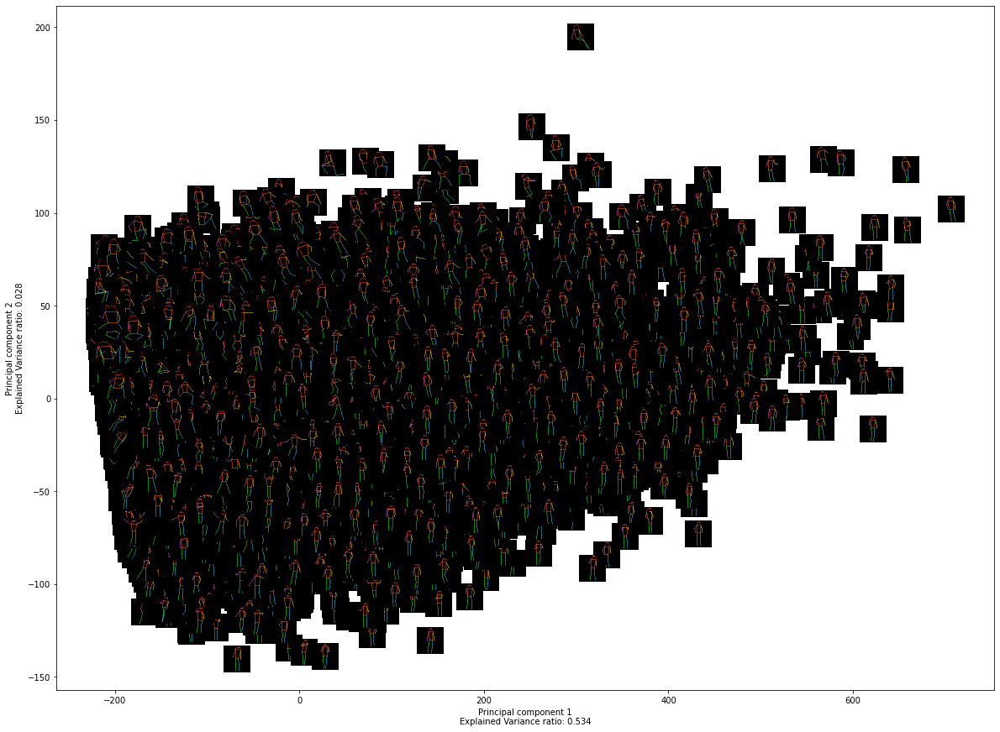

<Figure size 1440x1080 with 0 Axes>

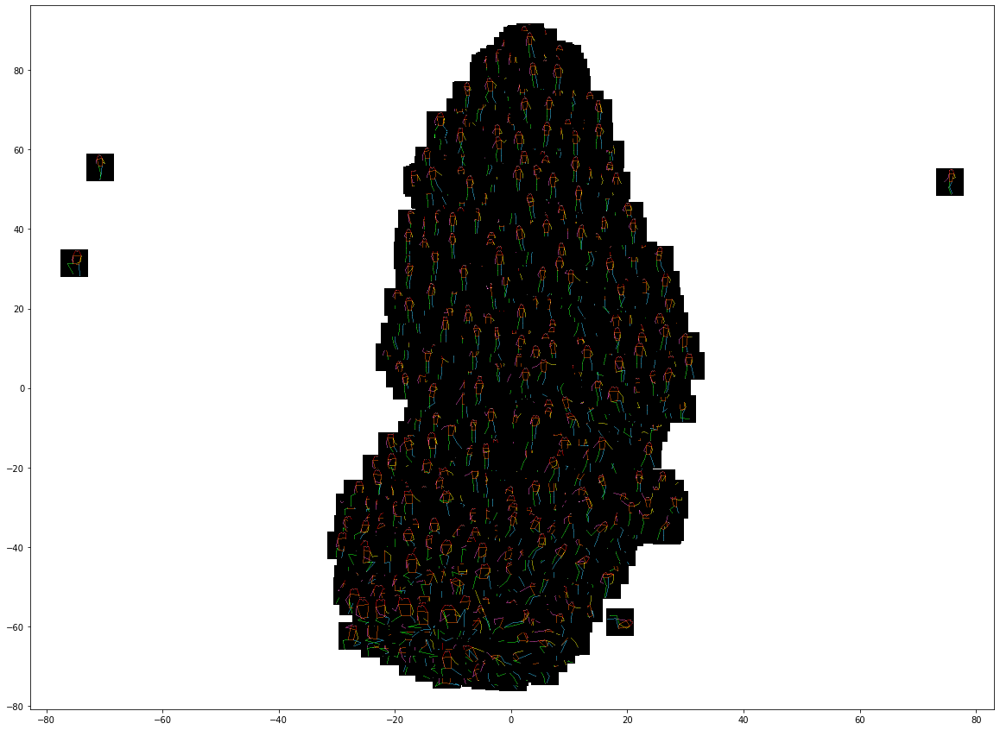

In [11]:
""" 2D plots """
# PCA plot
visualize_2d_skeleton_plot(bottleneck_pca_transformed_2, gt_heatmaps, is_pca = True, pca = pca_2)

# t-SNE plot
visualize_2d_skeleton_plot(bottleneck_tsne_transformed_2, gt_heatmaps)

KMedoids


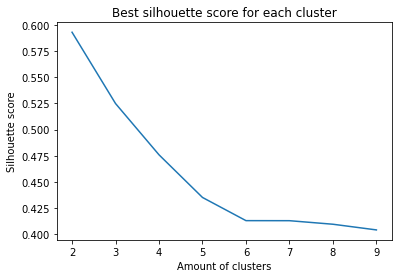

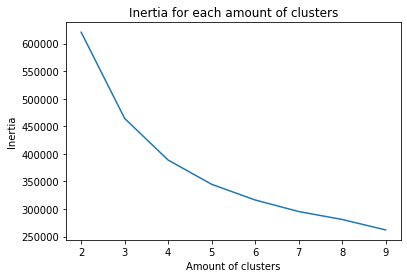

KMeans


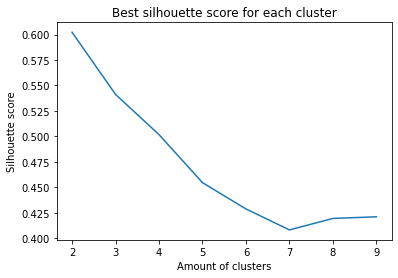

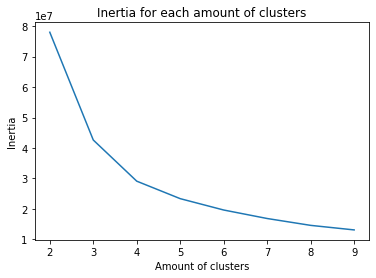

In [15]:
""" Clustering on 2D data """
print("KMedoids")
_, pca_kmedoids_sil, kmedoids_centroids_2 = run_clustering(bottleneck_pca_transformed_2)

print("KMeans")
_, pca_kmeans_sil, kmeans_centroids_2 = run_clustering(bottleneck_pca_transformed_2, model_type = "KMeans")

In [18]:
""" Reverse PCA on the centroids """
kmedoids_centroids_inversed_2 = pca_2.inverse_transform(kmedoids_centroids_2).reshape((kmedoids_centroids_2.shape[0], 256, 4, 4))
kmeans_centroids_inversed_2 = pca_2.inverse_transform(kmeans_centroids_2).reshape((kmeans_centroids_2.shape[0], 256, 4, 4))

In [19]:
""" Decode the centroids """
kmedoids_centroids_decoded_2 = model.decode(torch.from_numpy(kmedoids_centroids_inversed_2).to(device))
kmeans_centroids_decoded_2 = model.decode(torch.from_numpy(kmeans_centroids_inversed_2).to(device))

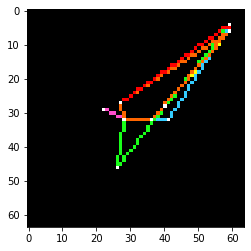

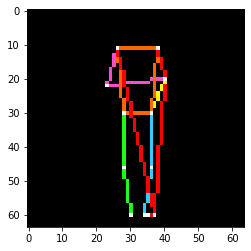

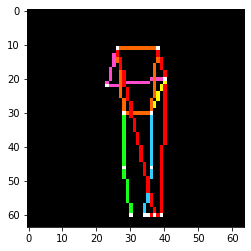

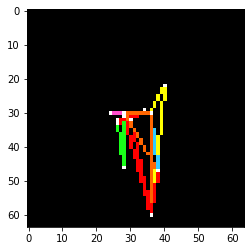

In [20]:
""" Visualize our results """
for img in kmedoids_centroids_decoded_2:
    img = turn_featuremaps_to_keypoints(img.cpu())
    img = draw_skeleton(img)
    plt.imshow(img)
    plt.show()

for img in kmeans_centroids_decoded_2:
    img = turn_featuremaps_to_keypoints(img.cpu())
    img = draw_skeleton(img)
    plt.imshow(img)
    plt.show()

In [28]:
""" Now we do the same, but instead with 405 components, which explains 95% of the variance """
NUM_COMPONENTS = 405
pca_405 = create_pca(bottleneck_arr, NUM_COMPONENTS = NUM_COMPONENTS, show_figs = False)
bottleneck_pca_transformed_405 = pca_405.transform(bottleneck_arr)
print("Explained variance", sum(pca_405.explained_variance_ratio_)) 

Explained variance 0.9503089347708737


PCA KMedoids


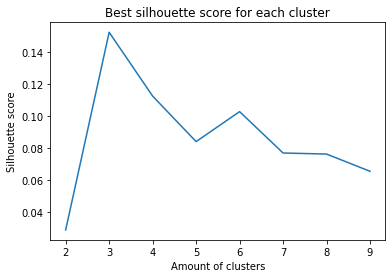

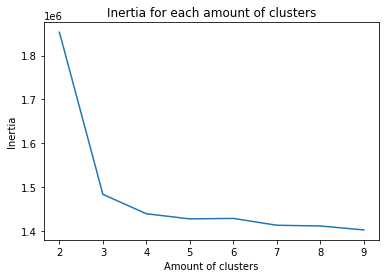

PCA KMeans


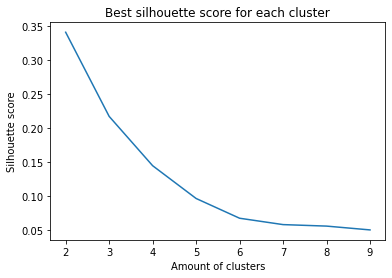

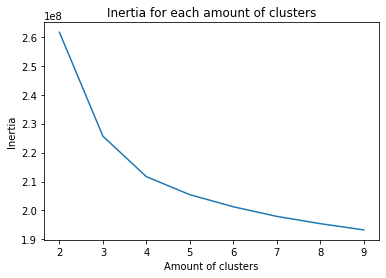

In [29]:
""" Clustering on 405D data """
print("PCA KMedoids")
_, pca_kmedoids_sil, kmedoids_centroids_405 = run_clustering(bottleneck_pca_transformed_405)

print("PCA KMeans")
_, pca_kmeans_sil, kmeans_centroids_405 = run_clustering(bottleneck_pca_transformed_405, model_type = "KMeans")

In [30]:
kmedoids_centroids_inversed_405 = pca_405.inverse_transform(kmedoids_centroids_405).reshape((kmedoids_centroids_405.shape[0], 256, 4, 4))
kmeans_centroids_inversed_405 = pca_405.inverse_transform(kmeans_centroids_405).reshape((kmeans_centroids_405.shape[0], 256, 4, 4))

In [32]:
""" Decode the centroids """
kmedoids_centroids_decoded_405 = model.decode(torch.from_numpy(kmedoids_centroids_inversed_405).to(device))
kmeans_centroids_decoded_405 = model.decode(torch.from_numpy(kmeans_centroids_inversed_405).to(device))

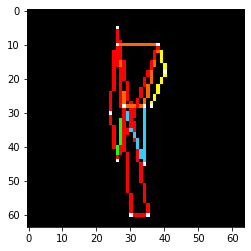

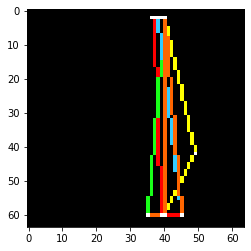

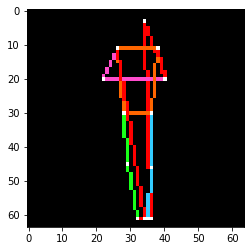

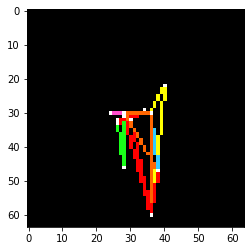

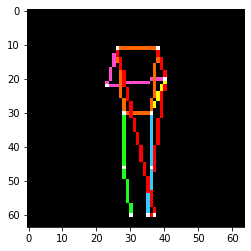

In [33]:
""" Visualize our results """
for img in kmedoids_centroids_decoded_405:
    img = turn_featuremaps_to_keypoints(img.cpu())
    img = draw_skeleton(img)
    plt.imshow(img)
    plt.show()

for img in kmeans_centroids_decoded_405:
    img = turn_featuremaps_to_keypoints(img.cpu())
    img = draw_skeleton(img)
    plt.imshow(img)
    plt.show()

In [39]:
""" AS THE ABOVE ARE WITHOUT SKIP-CONNECTIONS, LETS TRY WITH THEM (THUS, WE CANNOT USE KMEANS) """

""" LOADING MODEL """
model = SHG(num_hourglasses = 1).to(device)
model.load_state_dict(torch.load(MODEL_DIR))
model.eval()
print()

In [74]:
""" FINDING IDs OF THE KMEDOIDS CENTROIDS """

kmedoids_centroids_2_IDs = []
kmedoids_centroids_405_IDs = []

for x_2, ID in zip(bottleneck_pca_transformed_2, IDs):
    x_2 = x_2.reshape((1, -1))

    # Finding ID for 2D kmedoids centroids
    if (len(kmedoids_centroids_2_IDs) != len(kmedoids_centroids_2)):
        for centroid in kmedoids_centroids_2:
            if ((centroid == x_2).any()): # Reasonf or using .any(): Problems with comparing floats
                kmedoids_centroids_2_IDs.append(ID)
                print("2D centroid found!")

    if (len(kmedoids_centroids_2_IDs) == len(kmedoids_centroids_2)):
        break

print(kmedoids_centroids_2_IDs)

for x_405, ID in zip(bottleneck_pca_transformed_405, IDs):
    x_405 = x_405.reshape((1, -1))

    # Finding ID for 405D kmedoids centroids
    if (len(kmedoids_centroids_405_IDs) != len(kmedoids_centroids_405)):
        for centroid in kmedoids_centroids_405:
            if ((centroid == x_405).all()):
                kmedoids_centroids_405_IDs.append(ID)
                print("405D centroid found!")

    if (len(kmedoids_centroids_405_IDs) == len(kmedoids_centroids_405)):
        break

print(kmedoids_centroids_405_IDs)

2D centroid found!
2D centroid found!
[('261750_3.png',), ('131735_0.png',)]
405D centroid found!
405D centroid found!
405D centroid found!
[('43611_0.png',), ('394303_5.png',), ('357860_0.png',)]


In [75]:
""" LOADING IMAGES AND GROUND TRUTH HEATMAPS OF THE KMEDOIDS CENTROIDS """

kmedoids_centroids_2_imgs = []
kmedoids_centroids_2_gt_heatmaps = []

for ID in kmedoids_centroids_2_IDs: # NOTE: NOGET GÅR GALT HER.
    # Loading images of the 2D kmedoids centroids
    img = Image.open(TRAIN_IMGS_PATH + ID[0])
    img = TF.to_tensor(img)
    TF.normalize(img, average_rgb, [1, 1, 1], inplace = True)
    kmedoids_centroids_2_imgs.append(img)

    # Loading ground truth heatmaps of the 2D kmedoids centroids
    gt_heatmaps = []
    for i in range(17):
        gt_heatmaps.append(torch.from_numpy(np.load(TRAIN_HEATMAPS_PATH + ID[0][:-4] + "/" + str(i) + ".npy")))

    gt_heatmaps = torch.stack(gt_heatmaps)
    kmedoids_centroids_2_gt_heatmaps.append(gt_heatmaps)


kmedoids_centroids_405_imgs = []
kmedoids_centroids_405_gt_heatmaps = []

for ID in kmedoids_centroids_405_IDs:
    # Loading images of the 405D kmedoids centroids
    img = Image.open(TRAIN_IMGS_PATH + ID[0])
    img = TF.to_tensor(img)
    TF.normalize(img, average_rgb, [1, 1, 1], inplace = True)
    kmedoids_centroids_405_imgs.append(img)

    # Loading ground truth heatmaps of the 405D kmedoids centroids
    gt_heatmaps = []
    for i in range(17):
        gt_heatmaps.append(torch.from_numpy(np.load(TRAIN_HEATMAPS_PATH + ID[0][:-4] + "/" + str(i) + ".npy")))

    gt_heatmaps = torch.stack(gt_heatmaps)
    kmedoids_centroids_405_gt_heatmaps.append(gt_heatmaps)

2D


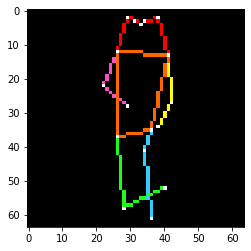

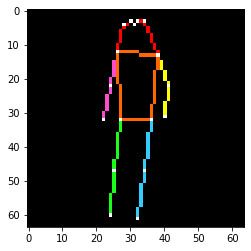

405D


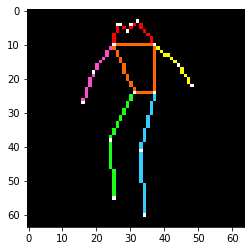

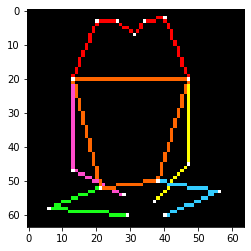

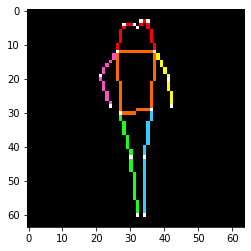

In [76]:
""" VISUALIZING THE GROUND TRUTH HEATMAPS OF THE KMEDOIDS CENTROIDS """

# 2D
print("2D")
for heatmap in kmedoids_centroids_2_gt_heatmaps:
    heatmap_arr = turn_featuremaps_to_keypoints(heatmap)
    heatmap_skeleton = draw_skeleton(heatmap_arr)
    plt.imshow(heatmap_skeleton)
    plt.show()

# 405D
print("405D")
for heatmap in kmedoids_centroids_405_gt_heatmaps:
    heatmap_arr = turn_featuremaps_to_keypoints(heatmap)
    heatmap_skeleton = draw_skeleton(heatmap_arr)
    plt.imshow(heatmap_skeleton)
    plt.show()

In [57]:
""" Loading model predictions """
# 2D
pred_2D = []
for img in kmedoids_centroids_2_imgs:
    img = img.reshape((1, img.shape[0], img.shape[1], img.shape[2]))
    img = img.to(device, dtype = torch.float)

    pred, _ = model(img)

    pred = pred.cpu()
    pred = turn_featuremaps_to_keypoints(pred)
    pred = draw_skeleton(pred)
    pred_2D.append(pred)

# 405D
pred_405D = []
for img in kmedoids_centroids_405_imgs:
    img = img.reshape((1, img.shape[0], img.shape[1], img.shape[2]))
    img = img.to(device, dtype = torch.float)
    pred, _ = model(img)
    pred = pred.cpu()
    pred = turn_featuremaps_to_keypoints(pred)
    pred = draw_skeleton(pred)
    pred_405D.append(pred)

2D
405D


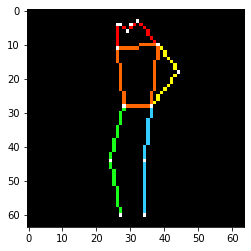

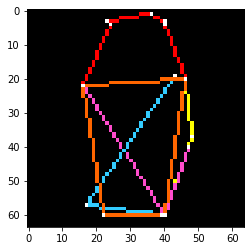

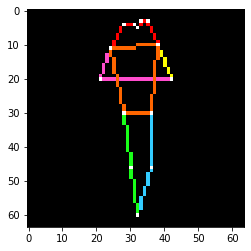

In [58]:
""" Visualizing model predictions """
print("2D")
for pred in pred_2D:
    plt.imshow(pred)
    plt.show()

print("405D")
for pred in pred_405D:
    plt.imshow(pred)
    plt.show()